# Experiment 1

Here, I implement a trivial neural network that tries to solve the unviscid Burgers' Equation:
$$
    \partial_t u + \partial_x f(u) = 0
$$
where $f(x) = \ln\left(\frac{e^x+e^{-x}}{2}\right)$ and $u^0=\exp\left(-\frac{x^2}{2}\right)$.

In [1]:
import torch
from torch import nn
import torch.nn.functional as F
import diffutils as dfu
from typing import Callable
from tqdm.notebook import tqdm
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML, display

In [2]:
class SimpleNN(nn.Module):
    def __init__(self):
        super(SimpleNN, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(2, 32),
            nn.Tanh(),
            nn.Linear(32, 256),
            nn.Tanh(),
            nn.Linear(256, 256),
            nn.Tanh(),
            nn.Linear(256, 32),
            nn.Tanh(),
            nn.Linear(32, 1)
        )

    def forward(self, x):
        return self.net(x)

In [3]:
def f(u: torch.Tensor):
    return 0.5 * u ** 2
def f_prime(u: torch.Tensor):
    # u with shape (N, 1) or (1,)
    # output with shape (N, 1, d) or (1, d)
    # d=1 in this case
    return u.unsqueeze(-1)  # shape (N, 1, 1) or (1, 1)

def residual_loss_fn(model: Callable[[torch.Tensor], torch.Tensor], x: torch.Tensor, t: torch.Tensor):
    # x has shape (N, 1) and t has shape (N,) or (N, 1)
    
    model_in = torch.cat([x, t.unsqueeze(-1)], dim=-1)  # shape (N, 1 + 1)
    jacob = dfu.compute_jacobian(model, model_in)  # shape (N, 1, 1+1)
    
    u = model(model_in)  # shape (N, 1)
    Dxu = jacob[:, :, :-1]  # shape (N, 1, 1)
    Dtu = jacob[:, :, -1]  # shape (N, 1)
    Dxf_u = f_prime(u)  # shape (N, 1, 1)
    divxfu = torch.einsum('nik,nkj->nij', Dxf_u, Dxu).diagonal(dim1=-2, dim2=-1).sum(-1)  # shape (N,)
    
    # residual
    res = Dtu[:,0] + divxfu  # shape (N, 1)
    
    # residual loss
    loss = torch.mean(res ** 2)
    
    return loss, res

def u0(x):
    # x has shape (N, 1) or (1,)
    # output has shape (N, 1) or (1,)
    return torch.exp(-x**2*0.5)
def condition_loss_fn(model: Callable[[torch.Tensor], torch.Tensor], x: torch.Tensor):
    # x has shape (N, 1)
    
    u = model(torch.cat([x, torch.zeros_like(x)], dim=-1))  # shape (N, 1)
    
    # condition loss
    res = u - u0(x)  # shape (N, 1)
    loss = torch.mean(res ** 2)
    
    return loss, res

  0%|          | 0/2000 [00:00<?, ?it/s]

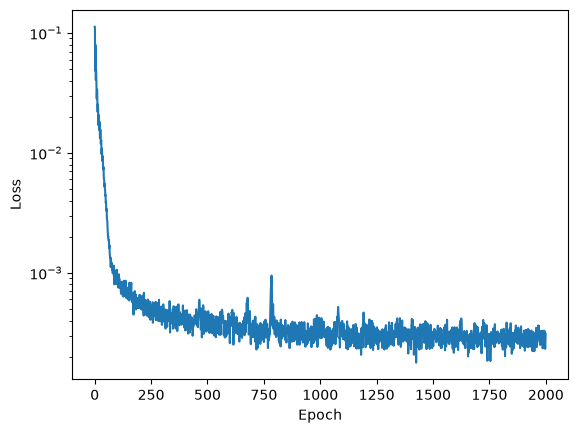

In [4]:
# training
model = SimpleNN()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

loss_history = []
for epoch in tqdm(range(2000)):
    optimizer.zero_grad()
    x = (torch.rand(2048, 1)*2-1)*10  # shape (N, d)
    t = torch.rand(2048)*20  # shape (N,)
    Rloss, _ = residual_loss_fn(model, x, t)
    
    x = (torch.rand(2048, 1)*2-1)*10  # shape (N, d)
    Closs, _ = condition_loss_fn(model, x)
    
    loss = Rloss + Closs
    
    loss_history.append(loss.item())
    loss.backward()
    optimizer.step()
    
plt.plot(loss_history)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.yscale('log')
plt.show()

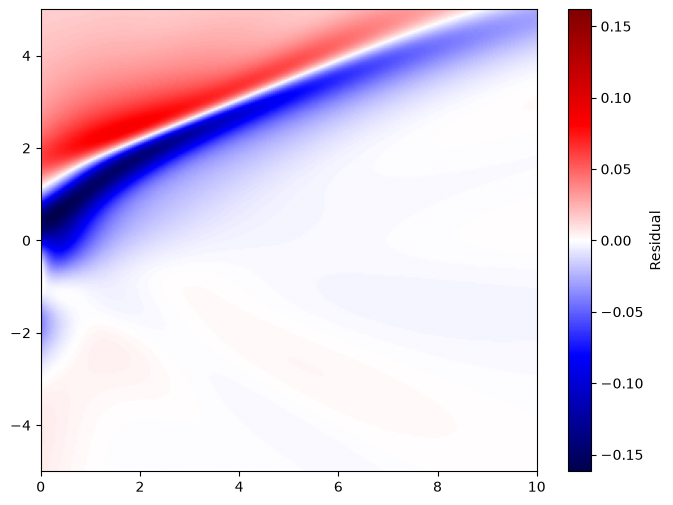

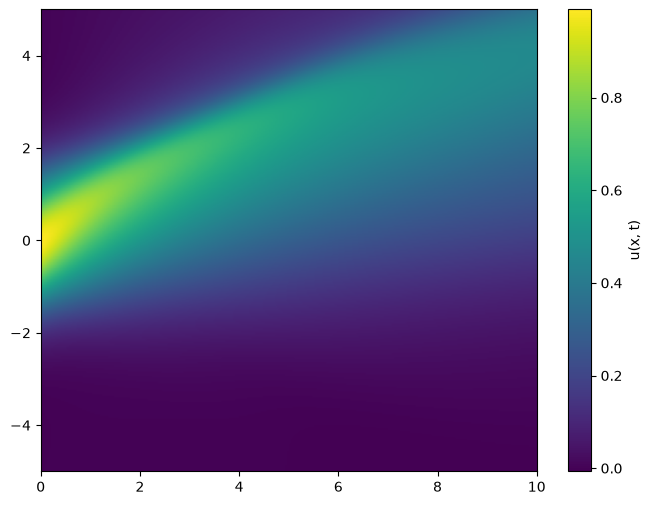

In [5]:
# show the loss
xpin = torch.linspace(-5, 5, 300).unsqueeze(-1)  # shape (N, d)
tpin = torch.linspace(0, 10, 250)  # shape (N,)
x, t = torch.meshgrid(xpin.squeeze(-1), tpin, indexing='ij')
xflat = x.flatten().unsqueeze(-1)  # shape (N, d)
tflat = t.flatten()  # shape (N,)
_, res = residual_loss_fn(model, xflat, tflat)
reshaped_res = res.reshape(x.shape)  # shape (N, N)
u = model(torch.cat([xflat, tflat.unsqueeze(-1)], dim=-1)).reshape(x.shape)  # shape (N, N)

plt.figure(figsize=(8, 6))
value_min = reshaped_res.min().item()
value_max = reshaped_res.max().item()
value = max(abs(value_min), abs(value_max))
plt.imshow(reshaped_res.detach().numpy(), extent=[0, 10, -5, 5], vmin=-value, vmax=value, cmap='seismic', origin='lower', aspect='auto')
plt.colorbar(label='Residual')
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(u.detach().numpy(), extent=[0, 10, -5, 5], cmap='viridis', origin='lower', aspect='auto')
plt.colorbar(label='u(x, t)')
plt.show()

# animation in html
x_np = xpin.detach().numpy().squeeze(-1)
u_np = u.detach().numpy()
fig, ax = plt.subplots(figsize=(8, 4.5))
line, = ax.plot([], [], label="approximation", lw=2)
title = ax.text(0.5, 1.02, "", transform=ax.transAxes, ha="center")
ax.set_xlim(-5, 5)
ax.set_ylim(0, 1)
ax.set_xlabel("x")
ax.set_ylabel("u(x,t)")
ax.legend()
ax.grid(True, alpha=0.3)

def init():
    line.set_data([], [])
    title.set_text("")
    return line, title

def update(frame):
    line.set_data(x_np, u_np[:, frame])
    title.set_text(f"step {frame}")
    return line, title

ani = FuncAnimation(
    fig,
    update,
    frames=len(u_np[0]), #n_batch,
    init_func=init,
    interval=int(10*1000/len(u_np[0])),  # interval in milliseconds
    blit=True
)

plt.close(fig)
display(HTML(ani.to_jshtml()))
del ani

Avvio simulazione IMEX... (Steps: 419, eps: 0.001, a: 1.1)


  0%|          | 0/419 [00:00<?, ?it/s]

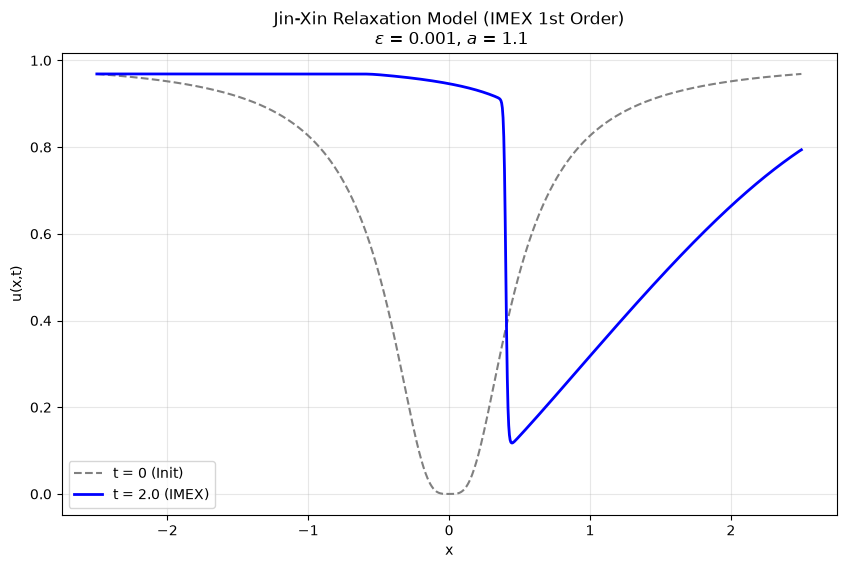

In [6]:
def compute_fluxes(u, v, a, Dx):
    """
    Calcola i flussi numerici ai bordi delle celle (i+1/2) 
    usando lo schema Upwind/Rusanov per il sistema di Jin-Xin.
    """
    sqrt_a = torch.sqrt(torch.tensor(a))
    
    # Pad per le condizioni al contorno (Neumann: derivata nulla ai bordi)
    # Replica il primo e l'ultimo elemento
    u_pad = F.pad(u, (1, 1), mode='replicate')
    v_pad = F.pad(v, (1, 1), mode='replicate')
    
    # Valori a sinistra (L) e a destra (R) dell'interfaccia i+1/2
    u_L = u_pad[..., :-1]
    u_R = u_pad[..., 1:]
    v_L = v_pad[..., :-1]
    v_R = v_pad[..., 1:]
    
    # Flusso di Rusanov per Jin-Xin (Media centrale + stabilizzazione Upwind)
    # F_{i+1/2} = 0.5 * (F_L + F_R) - 0.5 * velocità_max * (U_R - U_L)
    v_flux  = 0.5 * (v_L + v_R) - 0.5 * sqrt_a * (u_R - u_L)
    au_flux = 0.5 * a * (u_L + u_R) - 0.5 * sqrt_a * (v_R - v_L)
    
    # Derivata spaziale: (Flusso_{i+1/2} - Flusso_{i-1/2}) / Dx
    difv = (v_flux[..., 1:] - v_flux[..., :-1]) / Dx
    adifu = (au_flux[..., 1:] - au_flux[..., :-1]) / Dx
    
    return adifu, difv

def imex_step(u, v, Dt, Dx, eps, a):
    """
    Singolo passo temporale IMEX.
    """
    # 1. Calcolo derivate spaziali con schema stabile
    adifu, difv = compute_fluxes(u, v, a, Dx)
    
    # 2. Passo Esplicito per u (Trasporto)
    u_next = u - Dt * difv
    
    # 3. Passo Implicito per v (Rilassamento)
    v_next = (eps * v - eps * Dt * adifu + Dt * f(u_next)) / (eps + Dt)
    
    return u_next, v_next

# --- SETUP PARAMETRI ---
N = 1000
L = 5.0
Dx = L / N
eps = 0.001      # Più è piccolo, più lo shock è ripido
a = 1.1          # Condizione sub-caratteristica: a > u^2. Dato che u max = 1, a=1.2 è sicuro.
T_final = 2.0    # Tempo di simulazione
Dt = Dx / torch.sqrt(torch.tensor(a))
steps = int(T_final / Dt)

x = torch.linspace(-L/2, L/2, N)

# --- CONDIZIONE INIZIALE ---
# Gaussiana che evolverà in uno shock
#u = torch.exp(- 0.5 * x**2 / 0.1).unsqueeze(0).unsqueeze(0) # Shape: (1, 1, N)
#u = torch.sin(x * 5).unsqueeze(0).unsqueeze(0)**2 # Shape: (1, 1, N)
u = ((x**2)/(x**2 + 0.1)).unsqueeze(0).unsqueeze(0)**2 # Shape: (1, 1, N)
v = f(u) # Inizializzazione all'equilibrio locale per evitare layer iniziali spuri

u_init = u.clone()

print(f"Avvio simulazione IMEX... (Steps: {steps}, eps: {eps}, a: {a})")

# --- LOOP TEMPORALE ---
for n in tqdm(range(steps)):
    u, v = imex_step(u, v, Dt, Dx, eps, a)

# --- PLOT RISULTATI ---
u_final_np = u.squeeze().numpy()
u_init_np = u_init.squeeze().numpy()
x_np = x.numpy()

plt.figure(figsize=(10, 6))
plt.plot(x_np, u_init_np, label="t = 0 (Init)", linestyle="--", color="gray")
plt.plot(x_np, u_final_np, label=f"t = {T_final} (IMEX)", color="blue", linewidth=2)
plt.title(f"Jin-Xin Relaxation Model (IMEX 1st Order)\n $\\epsilon$ = {eps}, $a$ = {a}")
plt.xlabel("x")
plt.ylabel("u(x,t)")
plt.grid(True, alpha=0.3)
plt.legend()
plt.show()

In [7]:
# make the dataset
# [(u,v),(u_next,v_next)]
dataset = []

with torch.no_grad():
    variances = torch.linspace(0.1, 2.0, 20)    # concave
    frequencies = torch.linspace(0.5, 5.0, 20)  # concave - convex
    intensities = torch.linspace(0.1, 2.0, 20)  # convex
    for var in tqdm(variances, leave=True):
        u = torch.exp(- 0.5 * x**2 / var).unsqueeze(0).unsqueeze(0) # Shape: (1, 1, N)
        v = f(u) # Inizializzazione all'equilibrio locale per evitare layer iniziali spuri
        u_init = u.clone()
        for n in tqdm(range(steps), leave=False):
            u_next, v_next = imex_step(u, v, Dt, Dx, eps, a)
            dataset.append(((u, v),(u_next, v_next)))
            u, v = u_next, v_next

    for freq in tqdm(frequencies, leave=True):
        u = torch.sin(x * freq).unsqueeze(0).unsqueeze(0)**2
        v = f(u) # Inizializzazione all'equilibrio locale per evitare layer iniziali spuri
        u_init = u.clone()
        for n in tqdm(range(steps), leave=False):
            u_next, v_next = imex_step(u, v, Dt, Dx, eps, a)
            dataset.append(((u, v),(u_next, v_next)))
            u, v = u_next, v_next

    for val in tqdm(intensities, leave=True):
        u = ((x**2)/(x**2 + val)).unsqueeze(0).unsqueeze(0)**2
        v = f(u) # Inizializzazione all'equilibrio locale per evitare layer iniziali spuri
        u_init = u.clone()
        for n in tqdm(range(steps), leave=False):
            u_next, v_next = imex_step(u, v, Dt, Dx, eps, a)
            dataset.append(((u, v),(u_next, v_next)))
            u, v = u_next, v_next

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/419 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

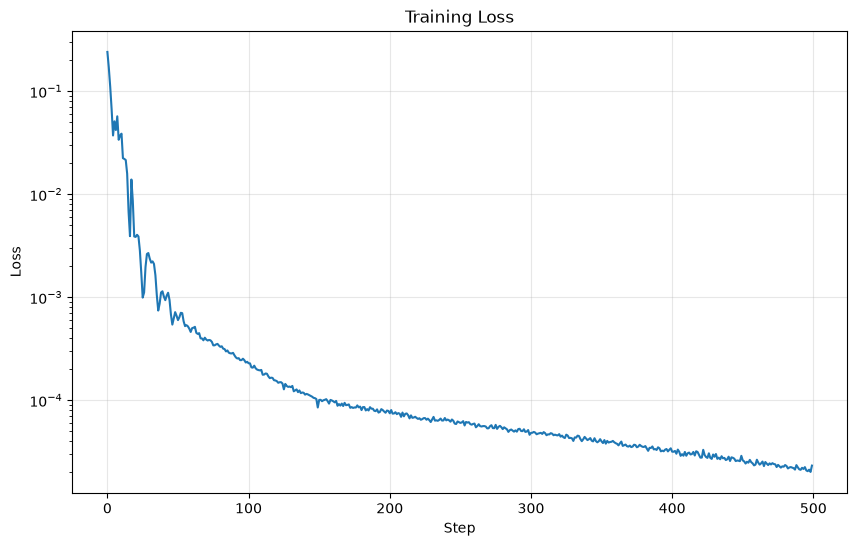

In [8]:
# NN
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.cnn = nn.Sequential(
            nn.Conv1d(2, 128, kernel_size=5, stride=1, padding=2, padding_mode='replicate'),
            nn.SiLU(),
            nn.Conv1d(128, 512, kernel_size=5, stride=1, padding=2, padding_mode='replicate'),
            nn.SiLU(),
            nn.Conv1d(512, 128, kernel_size=5, stride=1, padding=2, padding_mode='replicate'),
            nn.SiLU(),
            nn.Conv1d(128, 2, kernel_size=5, stride=1, padding=2, padding_mode='replicate'),
            nn.Softplus(),
        )

    def forward(self, x):
        return self.cnn(x)

model = Net()
model.train()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# convert dataset to torch tensors
# t_dataset[i] contains dataset[i]
# t_dataset[i][0] contains (u,v) in a certain time step
# t_dataset[i][1] contains (u_next,v_next) in the next time step
# so the shape of t_dataset is (len(dataset), 2, 2, 1, N)
t_dataset = torch.empty(len(dataset), 2, 2, 1, N)
for i, ((u, v), (u_next, v_next)) in enumerate(dataset):
    t_dataset[i, 0, 0] = u
    t_dataset[i, 0, 1] = v
    t_dataset[i, 1, 0] = u_next
    t_dataset[i, 1, 1] = v_next

loss_history = []

for epoch in tqdm(range(10)):
    # shuffle the dataset
    perm = torch.randperm(len(t_dataset))
    perm_dataset = t_dataset[perm]
    # create batches of (u,v) and (u_next,v_next) with size 512
    dataset_batches = torch.split(perm_dataset, 512)
    pbar = tqdm(dataset_batches, leave=False)
    for batch in pbar:
        u = batch[:, 0, 0]  # shape (batch_size, 1, N)
        v = batch[:, 0, 1]  # shape (batch_size, 1, N)
        u_next = batch[:, 1, 0]  # shape (batch_size, 1, N)
        v_next = batch[:, 1, 1]  # shape (batch_size, 1, N)
        optimizer.zero_grad()
        model_input = torch.cat([u, v], dim=1)  # shape (batch_size, 2, N)
        uv_pred = model(model_input)
        loss = F.mse_loss(uv_pred, torch.cat([u_next, v_next], dim=1))
        loss_history.append(loss.item())
        loss.backward()
        optimizer.step()
        pbar.set_postfix(loss=loss.item())
        
# plot the loss
plt.figure(figsize=(10, 6))
plt.plot(loss_history)
plt.xlabel("Step")
plt.ylabel("Loss")
plt.title("Training Loss")
plt.yscale("log")
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
# testing
model.eval()
total = 0
for (u, v), (u_next, v_next) in tqdm(dataset):
    model_input = torch.cat([u, v], dim=1)  # shape (1, 2, N)
    uv_pred = model(model_input)
    # uso la norma infinito per la loss
    loss = torch.max(torch.abs(uv_pred - torch.cat([u_next, v_next], dim=1))).item()
    total += loss
print(f"Average loss over {len(dataset)} samples: {total / len(dataset)}")

# save neural network
if total / len(dataset) < 0.019606484329570958:
    torch.save(model.state_dict(), "imex_net.pth")

  0%|          | 0/25140 [00:00<?, ?it/s]

Average loss over 25140 samples: 0.019606484329570958


In [14]:
# --- SETUP PARAMETRI ---
T_final = 1.0    # Tempo di simulazione
steps = int(T_final / Dt)
print(f"shape of u: {u.shape}, shape of v: {v.shape}, Dt: {Dt.item()}, Dx: {Dx}, steps: {steps}")

x = torch.linspace(-L/2, L/2, N)

# --- CONDIZIONE INIZIALE ---
u = (torch.sin(x * 0.5)**2).unsqueeze(0).unsqueeze(0) # Shape: (1, 1, N)
v = f(u) # Inizializzazione all'equilibrio locale per evitare layer iniziali spuri

u_init = u.clone()

print(f"Avvio simulazione IMEX-Net... (Steps: {steps}, eps: {eps}, a: {a})")

u_history = [u.clone()]

with torch.no_grad():
    # --- LOOP TEMPORALE ---
    for n in tqdm(range(steps)):
        model_in = torch.cat([u, v], dim=1)  # shape (1, 2, N)
        model_out = model(model_in)
        u, v = model_out[:, 0:1, :], model_out[:, 1:2, :]
        u_history.append(u.clone())

# --- PLOT RISULTATI ---
# animation in html
x_np = x.detach().numpy()
u_np = torch.cat(u_history, dim=0).detach().numpy().squeeze(1)  # shape (steps+1, N)
fig, ax = plt.subplots(figsize=(8, 4.5))
line, = ax.plot([], [], label="approximation", lw=2)
title = ax.text(0.5, 1.02, "", transform=ax.transAxes, ha="center")
ax.set_xlim(-L/2, L/2)
ax.set_ylim(0, 1)
ax.set_xlabel("x")
ax.set_ylabel("u(x,t)")
ax.legend()
ax.grid(True, alpha=0.3)

def init():
    line.set_data([], [])
    title.set_text("")
    return line, title

def update(frame):
    line.set_data(x_np, u_np[frame, :])
    title.set_text(f"step {frame}")
    return line, title

ani = FuncAnimation(
    fig,
    update,
    frames=len(u_np[:,0]), #n_batch,
    init_func=init,
    interval=int(T_final*1000/len(u_np[0])),  # interval in milliseconds
    blit=True
)

plt.close(fig)
display(HTML(ani.to_jshtml()))
del ani

shape of u: torch.Size([1, 1, 1000]), shape of v: torch.Size([1, 1, 1000]), Dt: 0.004767312668263912, Dx: 0.005, steps: 209
Avvio simulazione IMEX-Net... (Steps: 209, eps: 0.001, a: 1.1)


  0%|          | 0/209 [00:00<?, ?it/s]

In [ ]:
"""
# differentiation of a FCN

# example of input
N = 50
B = 5
x = torch.rand(B, 2, N)  # shape (B, 2, N)
model(x)
# compute manually the influence of the input on the output
influence = 17  # = somma kernel sizes - numero layer + 1

# sampling
M = 100
M = min(M, N-influence+1)
# cut the input in a batch of windows with shape (B, M, 2, influence)
windows = x.unfold(2, influence, 1)  # shape (B, 2, N-influence+1, influence)
windows = windows[:, :, torch.randperm(N-influence+1)[:M], :]  # shape (B, 2, M, influence)
windows = windows.permute(0, 2, 1, 3)  # shape (B, M, 2, influence)

# compress the batches
wind_compress = windows.reshape(-1, 2, influence)

# compute jacobian for each point in the batch
wind_compress = wind_compress.reshape(-1, 2*influence)  # shape (B*M, 2*influence)
J = dfu.compute_jacobian(
    lambda x: model(x.reshape(-1, 2, influence)).reshape(-1, 2*influence),
    wind_compress.reshape(-1, 2*influence)
)  # shape (B*M, 2*influence, 2*influence)
J = J.reshape(B, M, 2, influence, 2, influence)  # shape (B, M, 2, influence, 2, influence)
# get only central components
J = J[:, :, influence//2, :, :, :]  # shape (B, M, 2, 2, influence)

# make the sparse matrix
# if sJ is the sparse matrix, then it has shape B, d, N, d, N and
# sJ[q,w,e,r,t] = J[q,e,unfold(w),r,unfold(t)]
# sJ[q,w,e,r,t] is the derivative of the output component r(channel),t(position)
"""

torch.Size([5, 34, 2, 17, 2])